In [138]:
import os 
import sys

import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import trange, tqdm
from pathlib import Path
from skimage import exposure, io
import h5py
import cv2 as cv
from skimage.util import img_as_ubyte
from skimage import exposure
import pandas as pd
from joblib import Parallel, delayed
from functools import partial


In [139]:
p_dir = (Path().cwd().parents[0]).absolute()

In [140]:
%load_ext autoreload
%autoreload 2

module_path = str(p_dir / "src")

if module_path not in sys.path:
    sys.path.append(module_path)

import utils as my_utils

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [141]:
match_info_dir = p_dir / 'data' / 'registration'
IMC_path = p_dir / 'data' / 'IMC' 
core = 'E6_ome'

# Import IMC data 

In [153]:
from skimage.transform import rotate

def get_info(img_folder):
    """Function returns the info from folder containing multi-cycle staigning on cell

    Args:
        img_folder (str) : imgage folder path to get information
        name_dict (dict) : three level dictionnary mapping cycle -> channel -> marker name

    Returns:
        pandas dataframe with information
    """
    images_path = []
    markers = []

    # Loop through image folder
    for (dirpath, dirnames, filenames) in os.walk(img_folder):
        for name in sorted(filenames):
            if 'ome.tiff' not in name:
                continue 
            try:
                marker = name.split('_')[2].split('.')[0]
                if marker == 'contaminant':
                    continue
                elif marker == 'DNA':
                    if '191Ir' in name:
                        marker += '1'
                    else:
                        marker += '2'
            except:continue
            
            path = os.path.join(dirpath, name)
            markers.append(marker)
            images_path.append(path)
            
    info = {
        "Marker": markers,
        "Path": images_path,
    }
    df = pd.DataFrame(info)
    return df

def contrast_streching(img):
    p2, p98 = np.percentile(img, (5,99))
    return exposure.rescale_intensity(img, in_range=(p2, p98))

def read_img(path:str, rotation=0) -> np.ndarray:
    '''
    Read image from path
    '''
    img = io.imread(path, as_gray=True)
    img_rescale = rotate(img, rotation)
    img_rescale = contrast_streching(img_rescale)
    img_rescale = img_as_ubyte(img_rescale)
    return img_rescale

def joblib_loop(task, pics):
    return Parallel(n_jobs=20)(delayed(task)(i) for i in pics)

In [154]:
df = get_info(IMC_path / core)
rot = 90

In [155]:
markers = df.Marker.tolist()
paths = df.Path.tolist()
func = partial(read_img, rotation=rot)
imgs = joblib_loop(func, paths)

SMA


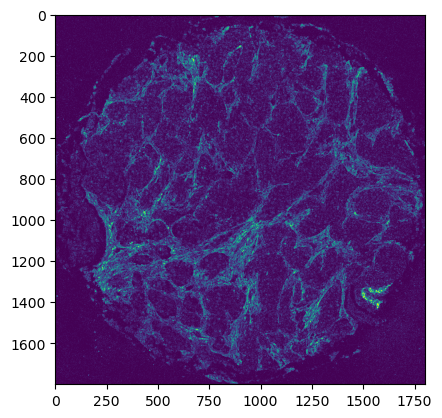

Vimentin


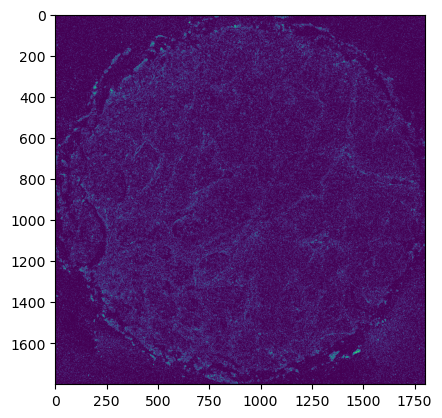

PanKeratin


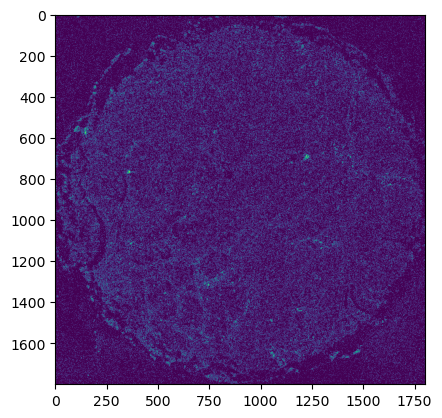

CD11b


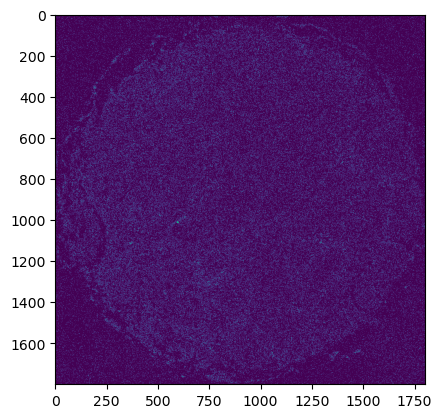

PDL1


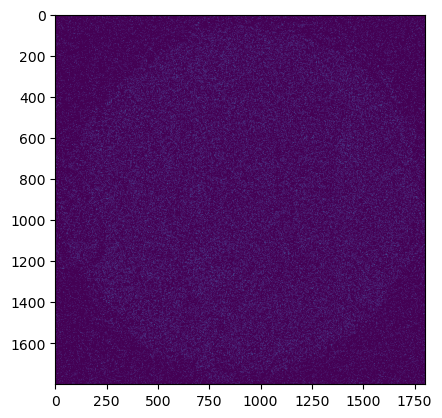

CD31


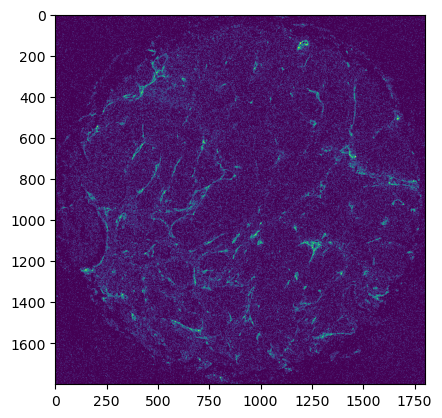

CD45


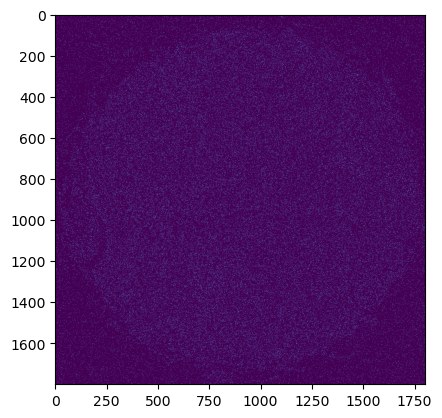

CD44


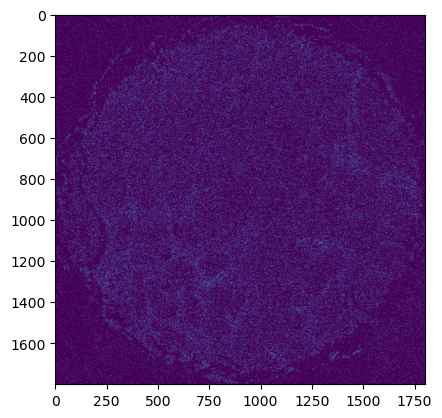

CD11c


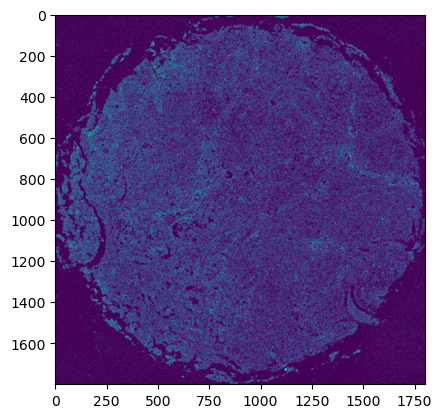

FoxP3


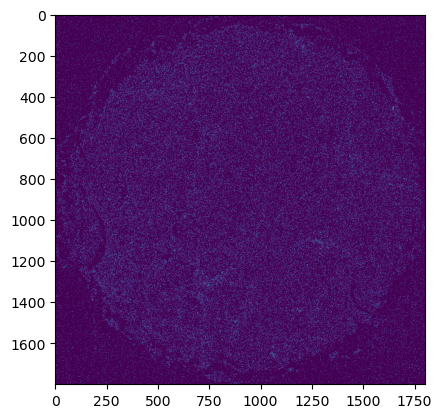

CD4


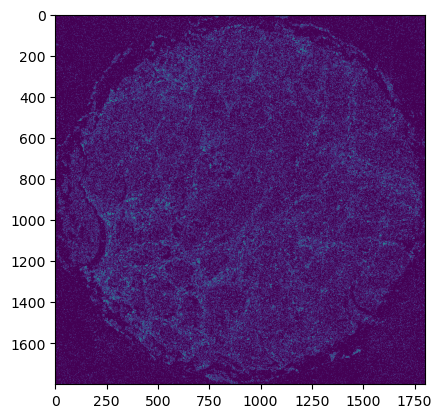

ECadherin


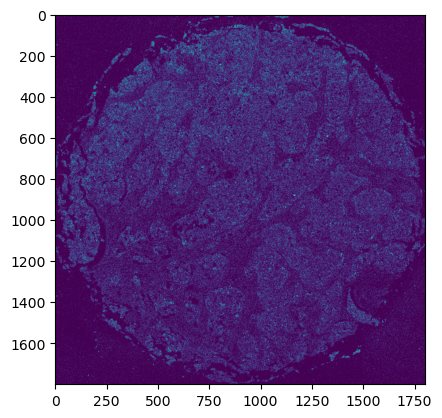

CD68


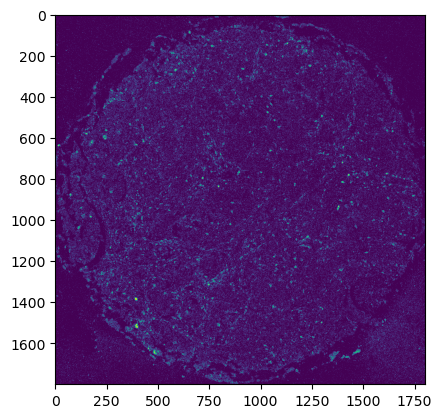

CD20


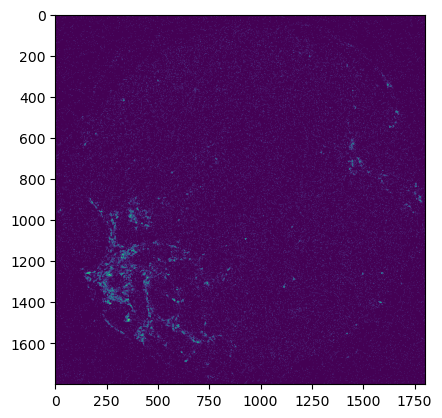

CD8


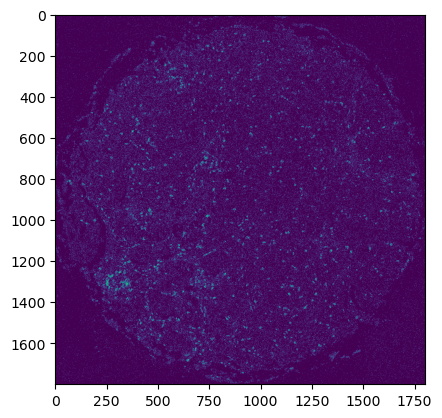

PD1


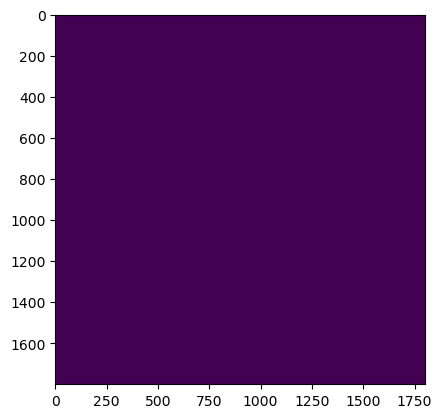

CD45RA


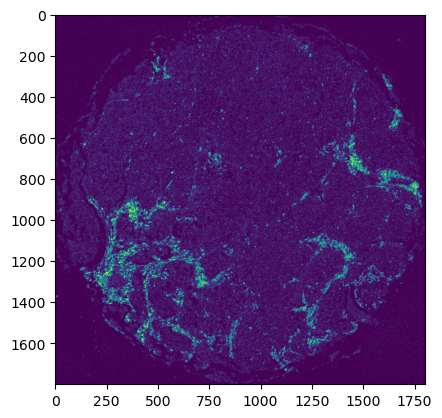

GranzymeB


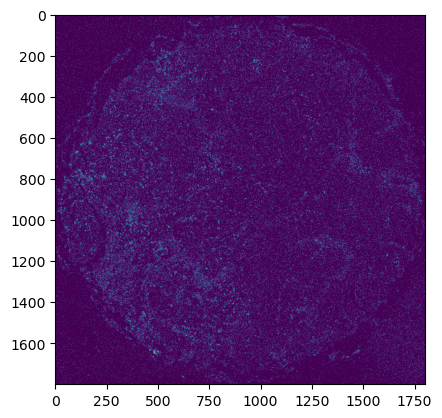

Ki67


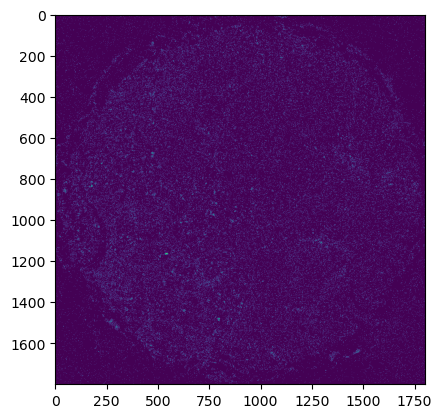

COL1


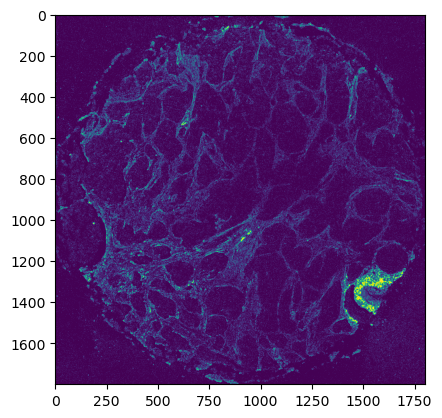

CD3


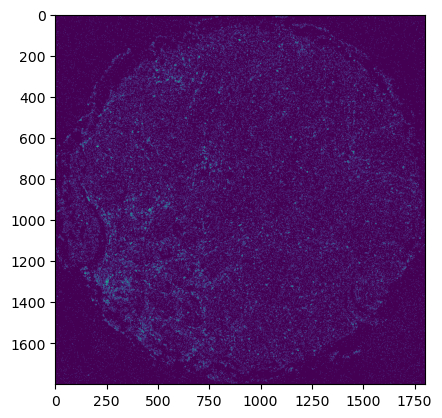

HistoneH3


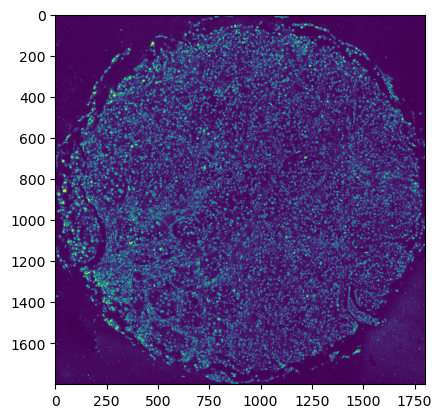

CD45RO


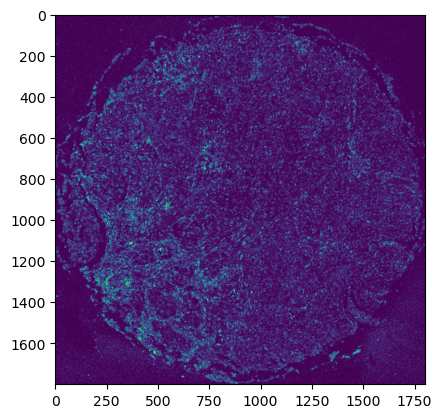

MHCII


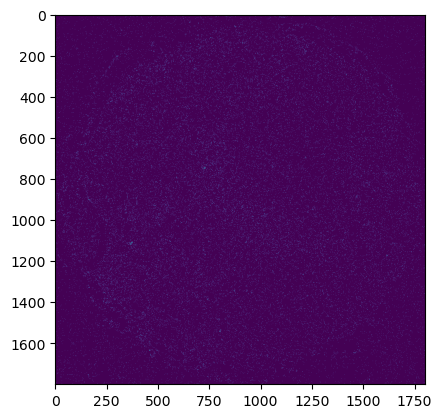

DNA1


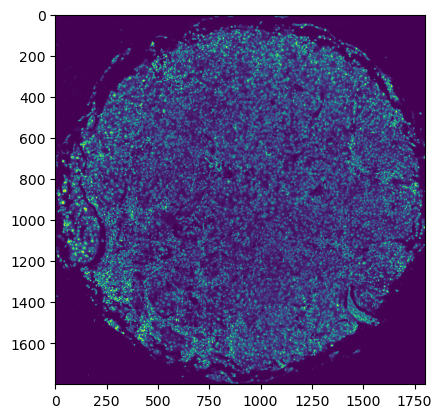

DNA2


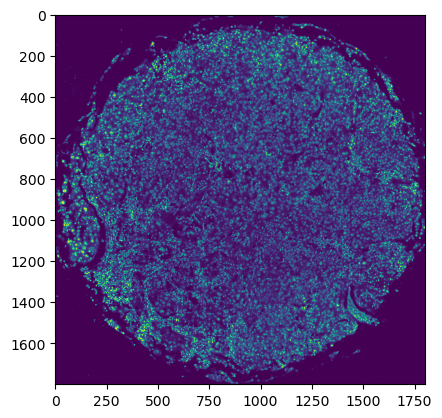

In [156]:
for i, img in enumerate(imgs):
    print(markers[i])
    plt.imshow(img)
    plt.show()

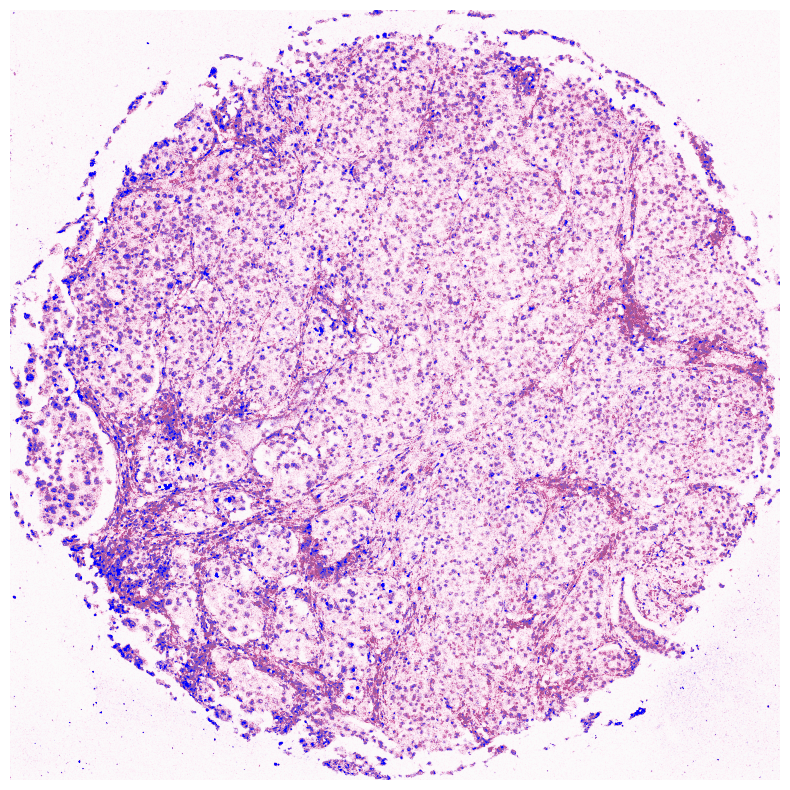

In [160]:
# nuclei_markers = ['HistoneH3', 'Ki67', 'FoxP3', 'DNA1', 'DNA2']
# cyto_markers = ['Vimentin', 'CD68', 'MHCII', 'GranzymeB', 'CD20', 'ECadherin', 'PanKeratin']

nuclei_markers = ['HistoneH3', 'CD45RO']
cyto_markers = ['Vimentin', 'SMA', 'CD68', 'ECadherin', 'GranzymeB', 'COL1']
    
avg_imgs = []
for i, img in enumerate(imgs):
    if markers[i] in nuclei_markers:
        avg_imgs.append(img)
img_nuclei = np.array(np.mean(avg_imgs, axis=(0)), dtype=np.uint8)

avg_imgs = []
for i, img in enumerate(imgs):
    if markers[i] not in cyto_markers:
        avg_imgs.append(img)
img_cyto = np.array(np.mean(avg_imgs, axis=(0)), dtype=np.uint8)

# Stack all cluster representation together 
data = np.stack((img_nuclei, img_cyto), axis=2)

# Select colormap 
cmap1 = plt.cm.PiYG_r
# Get the colormap colors
my_cmap1 = cmap1(np.linspace(0.5, 1.0, cmap1.N))
# Set alpha
my_cmap1[:,-1] = np.linspace(0.5, 1, cmap1.N)
# Creat1e new colormap
my_cmap1 = ListedColormap(my_cmap1)

# Select colormap 
cmap2 = plt.cm.bwr_r
# Get the colormap colors
my_cmap2 = cmap2(np.linspace(0.5, 1.0, cmap2.N))
# Set alpha
my_cmap2[:,-1] = np.linspace(0, 1, cmap2.N)
# Creat1e new colormap
my_cmap2 = ListedColormap(my_cmap2)

max1 = np.max(img_cyto)
max2 = np.max(img_nuclei)

fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(img_cyto, my_cmap1, vmax=max1//5, alpha=0.8)
ax.imshow(img_nuclei, my_cmap2, vmax=max2//1.5)
ax.axis('off')
plt.show()

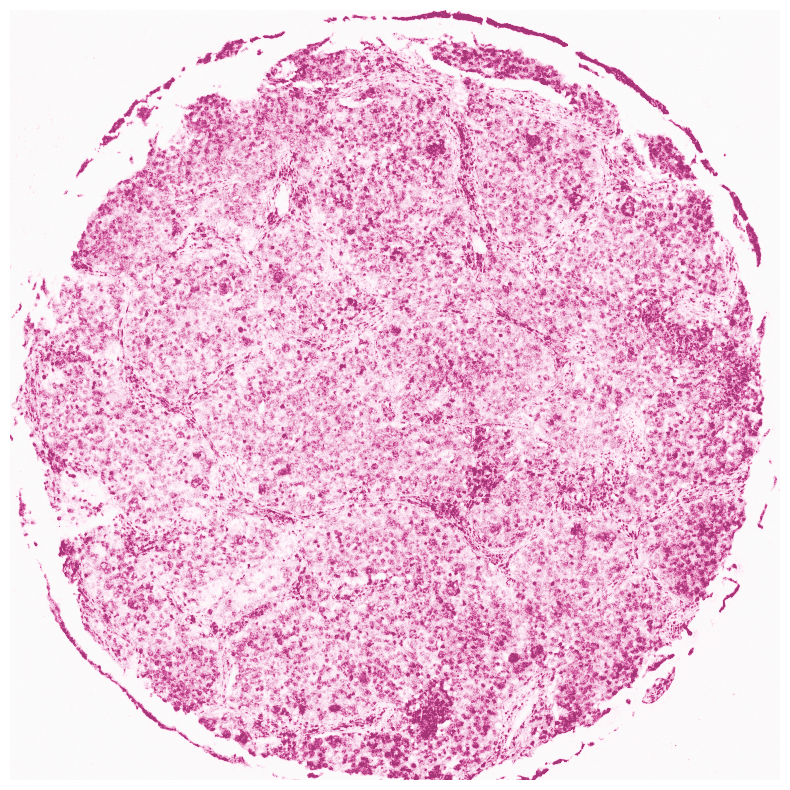

In [118]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(img_cyto, my_cmap1, vmax=max1//2.5, alpha=0.8)
ax.axis('off')
plt.show()

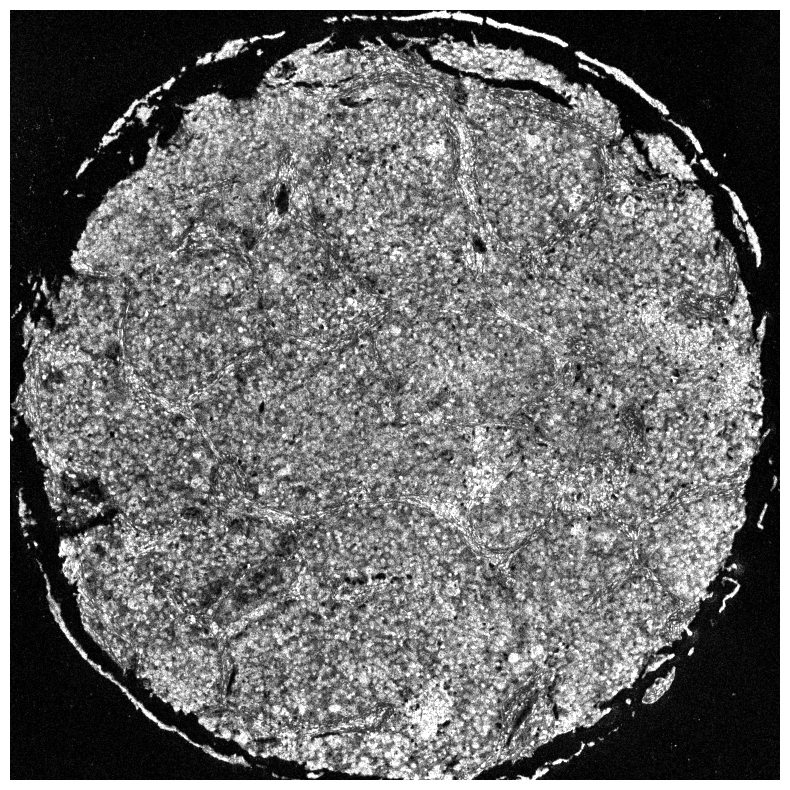

In [119]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(img_cyto, cmap='gray', vmax=max1//2.5)
ax.axis('off')
plt.show()

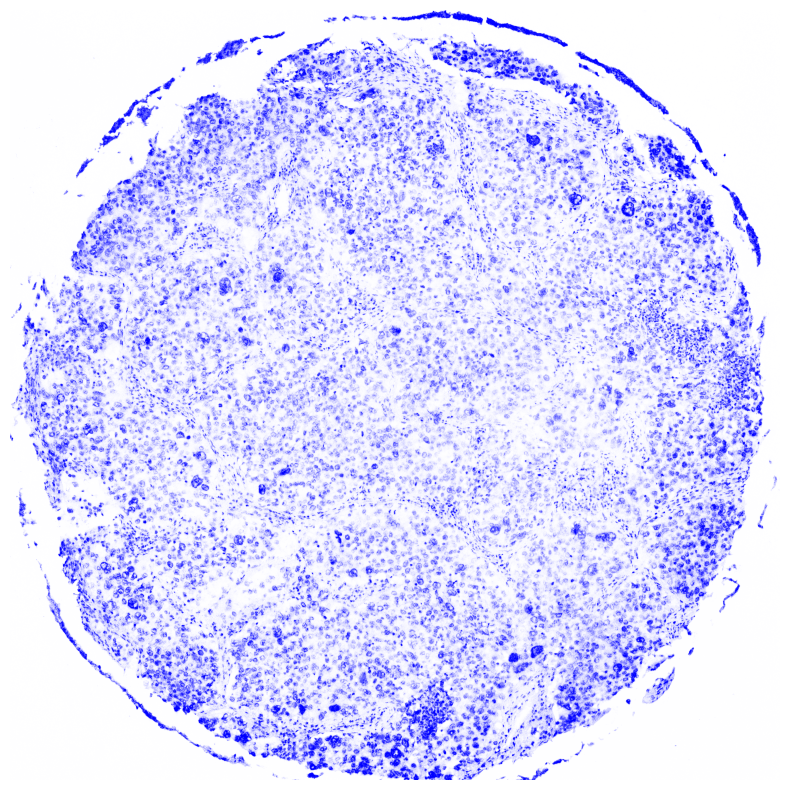

In [120]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(img_nuclei, my_cmap2, vmax=max2)
ax.axis('off')
plt.show()

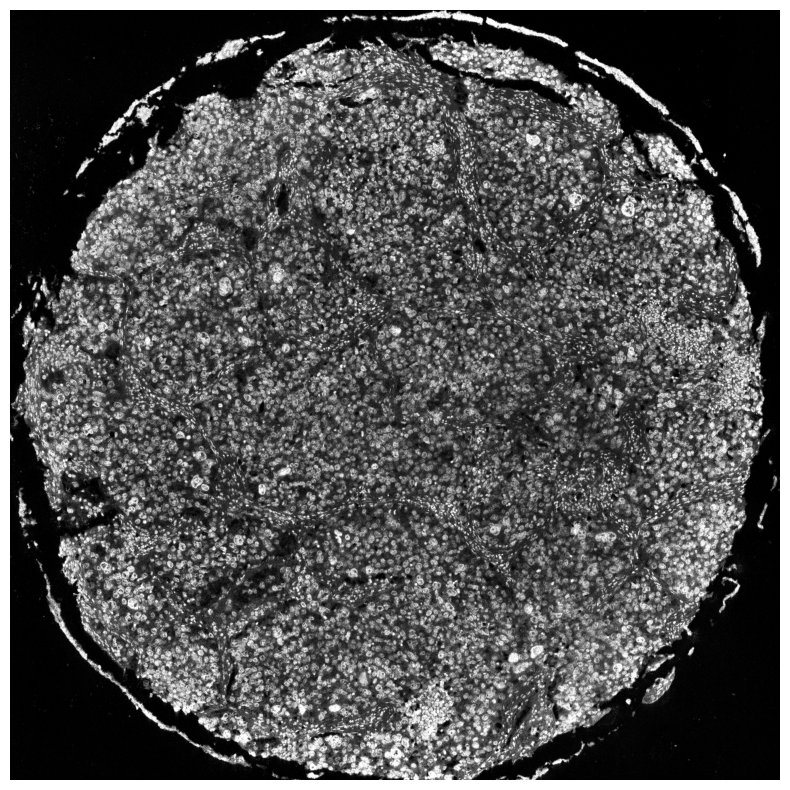

In [121]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(img_nuclei, vmax=max2, cmap='gray')
ax.axis('off')
plt.show()